# **Segmentation of Bin2cell**

### -> on both the morphology (H&E/IF) image and a visualisation of gene expression data

In [1]:
import matplotlib.pyplot as plt
import scanpy as sc
import numpy as np
import os

import bin2cell as b2c

#create directory for stardist input/output files
os.makedirs("stardist", exist_ok=True)

/pasteur/appa/homes/npont/miniconda3/envs/ERC/lib/python3.8/site-packages/paramiko/pkey.py:82: CryptographyDeprecationWarning: TripleDES has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.TripleDES and will be removed from this module in 48.0.0.
  "cipher": algorithms.TripleDES,
/pasteur/appa/homes/npont/miniconda3/envs/ERC/lib/python3.8/site-packages/paramiko/transport.py:219: CryptographyDeprecationWarning: Blowfish has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.Blowfish and will be removed from this module in 45.0.0.
  "class": algorithms.Blowfish,
/pasteur/appa/homes/npont/miniconda3/envs/ERC/lib/python3.8/site-packages/paramiko/transport.py:243: CryptographyDeprecationWarning: TripleDES has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.TripleDES and will be removed from this module in 48.0.0.
  "class": algorithms.TripleDES,


### Load data

In [2]:
#Path to spaceranger output
dir_base = '/pasteur/helix/projects/fast_npz/Naomie/Shahragim_Project/visium_HD/visiumHD_outputs/EOM/'
dir_base_2 = "counts/Sample_A1/outs/"

#Path to raw data
dir_base_raw = '/pasteur/helix/projects/CSD_hpc/data/lab/spatial/EOM_VisiumHD/'

path = dir_base + dir_base_2 + "binned_outputs/square_002um/"

#the image you used for --image of spaceranger, that's the one the spatial coordinates are based on

source_image_path = dir_base_raw + "scan_he/tiff_converted/sample_A1_highres_rgb.tif"
spaceranger_image_path = dir_base + dir_base_2 + "spatial"

In [6]:
path

'/pasteur/helix/projects/fast_npz/Naomie/Shahragim_Project/visium_HD/visiumHD_outputs/EOM/counts/Sample_A1/outs/binned_outputs/square_002um/'

In [3]:
adata = b2c.read_visium(path, 
                        source_image_path = source_image_path, 
                        spaceranger_image_path = spaceranger_image_path
                       )
adata.var_names_make_unique()
adata

/pasteur/appa/homes/npont/miniconda3/envs/ERC/lib/python3.8/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/pasteur/appa/homes/npont/miniconda3/envs/ERC/lib/python3.8/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 2629825 × 18085
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

### **Pre-filtering**

-> require genes to show up in min 3 spots 

-> and spots to have at least one UMI count i.e. filter out empty spots

In [4]:
sc.pp.filter_genes(adata, min_cells=3)
sc.pp.filter_cells(adata, min_counts=1)
adata

AnnData object with n_obs × n_vars = 2512578 × 17957
    obs: 'in_tissue', 'array_row', 'array_col', 'n_counts'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'spatial'
    obsm: 'spatial'

### **Create a custom high resolution image**

It is apparently particularly relevant when working with the 2 um bins. 

**Parameter for custom resolution: mpp**

'mpp' translates to how many micrometers are captured in each pixel

If we consider as an image the array coordinates (i.e. adata.obs["array_row"] and adata.obs["array_col"]), which corresponds to the visium HD spots positions, then each of the pixel have 2 micrometers so the variable mpp (=micrometer per pixel) is 2. 
Decreasing the mpp leads to better resolution i.e. less pixelized. They use 0.5. StarDist was trained on images of mpp 0.3.


scaled_he_image function crops the H&E image to create a custom resolution. It crops the H&E around the spatial grid (where the spatial transcriptomics data is available) and adds a buffer of 150 pixels around to keep some surrounding tissue. This new resolution image is stored in .obsm["spatial_cropped_150_buffer"]

In [5]:
#likely to be closer to 0.3 for your data
mpp = 0.5
b2c.scaled_he_image(adata, mpp=mpp, save_path="stardist/he.tiff")

Cropped spatial coordinates key: spatial_cropped_150_buffer
Image key: 0.5_mpp_150_buffer


In [6]:
adata

AnnData object with n_obs × n_vars = 2512578 × 17957
    obs: 'in_tissue', 'array_row', 'array_col', 'n_counts'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'spatial'
    obsm: 'spatial', 'spatial_cropped_150_buffer'

### **Correct for technical effect: bins are of variable size -> resulting in variable number of counts**

Visium HD suffers from variable bin sizing -> when printing the chips the 2 um bins have variable height and width -> consequently, the total counts per spot is variable. With b2c.destribe() we do kind of a normalization where adata.obs["array_row"] and adata.obs["array_col"] are respectively divided by the 0.99 quantile of total counts. It results in .obs[adjusted_counts_key]

In [7]:
b2c.destripe(adata)

_construct.py (163): Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


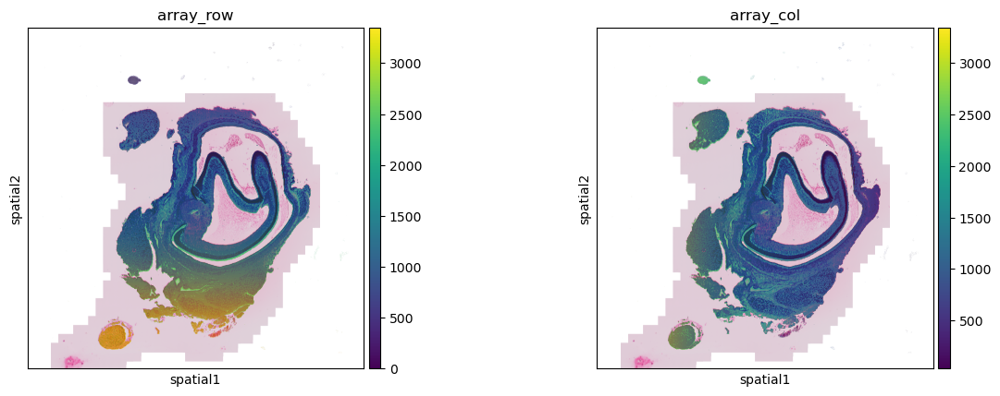

In [8]:
# We map the H&E image on the spots coordinates 
# The H&E coordinates (pixels unit) are distinct from
# the spatial transcriptomics spots coordinates which are in adata.obs["array_row"] and adata.obs["array_col"]
sc.pl.spatial(adata, img_key="hires", color=["array_row", "array_col"])

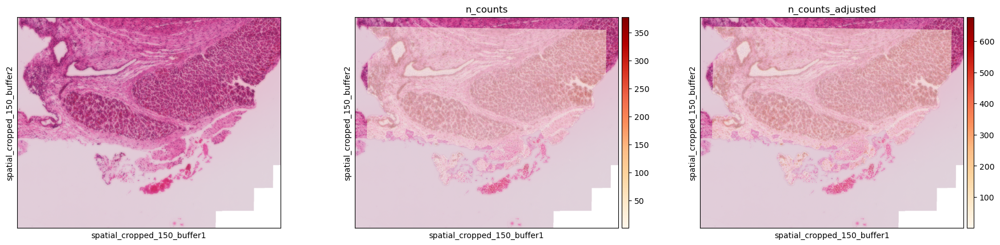

In [9]:
# Mask of the region of interest (defined in spots array coordinates, not in H&E image!)
# I used the previous 2 plots to approximate x and y values to set a ROI
mask = ((adata.obs['array_row'] >= 2500) & 
        (adata.obs['array_row'] <= 3300) & 
        (adata.obs['array_col'] >= 1000) & 
        (adata.obs['array_col'] <= 2000)
       )

bdata = adata[mask]

# Plot from left to right:
# the ROI
# the number of counts per spot before adjustment
# the nber of counts per spot after adjustment
sc.pl.spatial(bdata, color=[None, "n_counts", "n_counts_adjusted"], color_map="OrRd",
              img_key="0.5_mpp_150_buffer", basis="spatial_cropped_150_buffer")

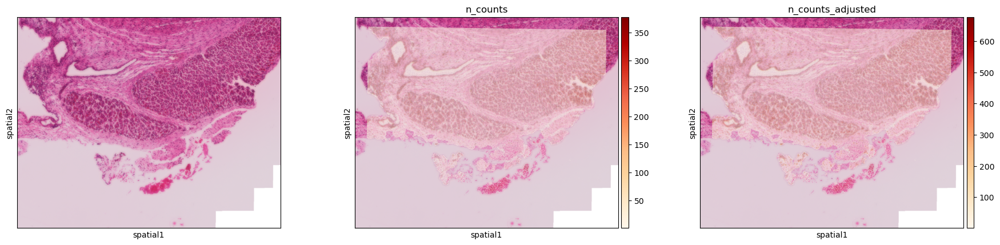

In [10]:
# Comparison of our custom high resolution image with the default image output by spaceranger
sc.pl.spatial(bdata, color=[None, "n_counts", "n_counts_adjusted"], color_map="OrRd")

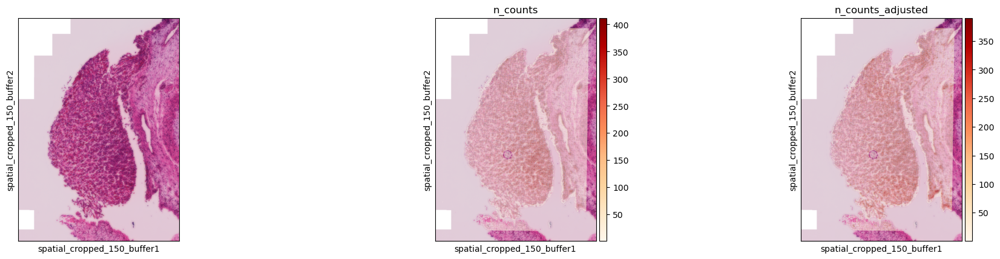

In [11]:
# ROI3
mask_3 = ((adata.obs['array_row'] >= 1700) & 
        (adata.obs['array_row'] <= 2600) & 
        (adata.obs['array_col'] >= 2000) & 
        (adata.obs['array_col'] <= 3000))

bdata_3 = adata[mask_3]

sc.pl.spatial(bdata_3, color=[None, "n_counts", "n_counts_adjusted"], color_map="OrRd",
              img_key="0.5_mpp_150_buffer", basis="spatial_cropped_150_buffer")

Prior to the adjustment, the count total has a striped appearance. The effect is diminished after the correction, i.e. it is more homogenous. **We removed a technical undesired effect**

### **StarDist segmentation**

They use prob_thresh of 0.01 instead of the default one of 0.1 to have a bit more objects. They say the default one is stringent.

In [12]:
b2c.stardist(image_path="stardist/he.tiff", 
             labels_npz_path="stardist/he.npz", 
             stardist_model="2D_versatile_he", 
             prob_thresh=0.01)

2025-03-07 16:00:16.975583: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


Found model '2D_versatile_he' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.692478, nms_thresh=0.3.
effective: block_size=(4096, 4096, 3), min_overlap=(128, 128, 0), context=(128, 128, 0)


functional.py (237): The structure of `inputs` doesn't match the expected structure.
Expected: ['input']
Received: inputs=Tensor(shape=(1, 256, 256, 3))
  0%|          | 0/12 [00:00<?, ?it/s]functional.py (237): The structure of `inputs` doesn't match the expected structure.
Expected: ['input']
Received: inputs=Tensor(shape=(1, None, None, 3))
100%|██████████| 12/12 [02:34<00:00, 12.86s/it]


Found 86388 objects


In [13]:
b2c.insert_labels(adata, 
                  labels_npz_path="stardist/he.npz", 
                  basis="spatial", 
                  spatial_key="spatial_cropped_150_buffer",
                  mpp=mpp, 
                  labels_key="labels_he")

Visualization of nuclei segmentation on the H&E custom resolution image

2187319645.py (6): Trying to modify attribute `.obs` of view, initializing view as actual.


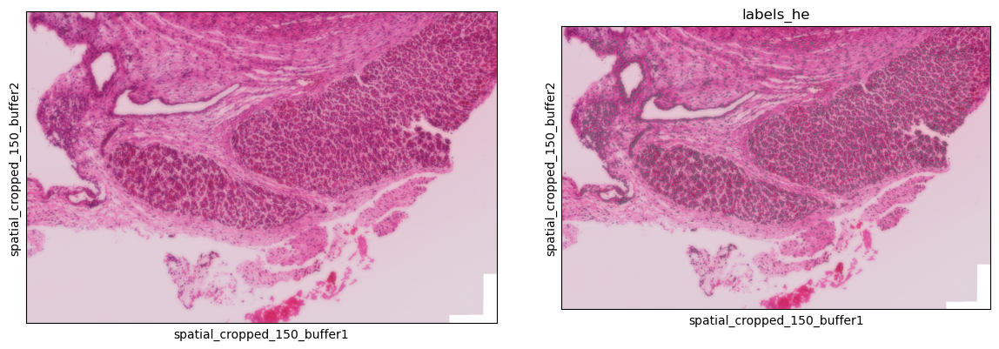

In [14]:
# Visualization of the segmentation on the ROI
bdata = adata[mask]

#the labels obs are integers, 0 means unassigned
bdata = bdata[bdata.obs['labels_he']>0]
bdata.obs['labels_he'] = bdata.obs['labels_he'].astype(str)

sc.pl.spatial(bdata, color=[None, "labels_he"], img_key="0.5_mpp_150_buffer", basis="spatial_cropped_150_buffer", legend_loc=None,save="segmentated_ROI.png")

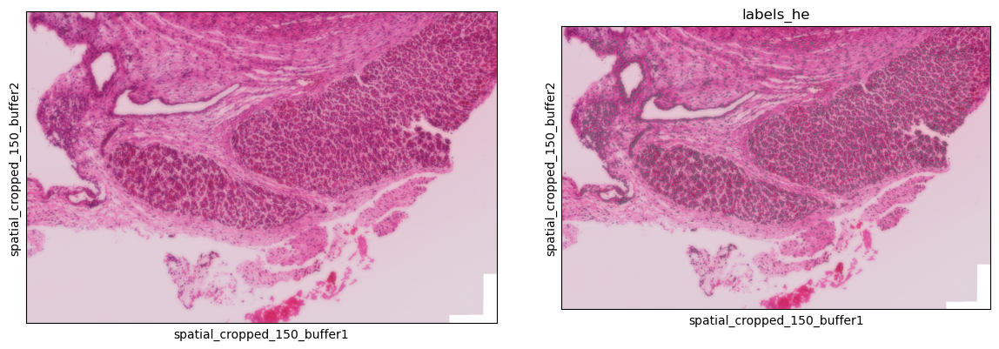

In [15]:
sc.pl.spatial(bdata, color=[None, "labels_he"], img_key="0.5_mpp_150_buffer", basis="spatial_cropped_150_buffer", legend_loc=None,color_map="viridis",save="segmentated_ROI1.png")

1312522287.py (12): Trying to modify attribute `.obs` of view, initializing view as actual.


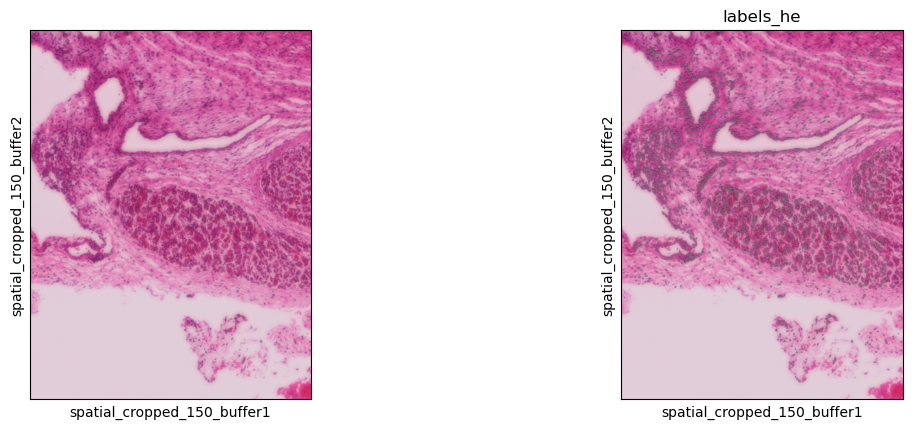

In [16]:
# Visualize the nuclei segmentation on the custom resolution H&E for a second ROI
mask_2 = ((adata.obs['array_row'] >= 2500) & 
        (adata.obs['array_row'] <= 3300) & 
        (adata.obs['array_col'] >= 1500) & 
        (adata.obs['array_col'] <= 2000)
       )

bdata_2 = adata[mask_2]

#the labels obs are integers, 0 means unassigned
bdata_2 = bdata_2[bdata_2.obs['labels_he']>0]
bdata_2.obs['labels_he'] = bdata_2.obs['labels_he'].astype(str)

sc.pl.spatial(bdata_2, color=[None, "labels_he"], img_key="0.5_mpp_150_buffer",
              basis="spatial_cropped_150_buffer", legend_loc=None,
              save="segmentated_ROI2.png")

2546027119.py (5): Trying to modify attribute `.obs` of view, initializing view as actual.


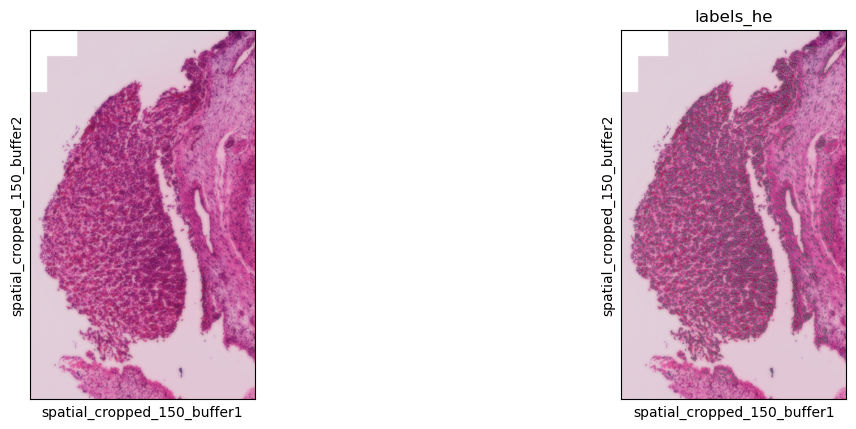

In [17]:
bdata_3 = adata[mask_3]

#the labels obs are integers, 0 means unassigned
bdata_3 = bdata_3[bdata_3.obs['labels_he']>0]
bdata_3.obs['labels_he'] = bdata_3.obs['labels_he'].astype(str)

sc.pl.spatial(bdata_3, color=[None, "labels_he"], img_key="0.5_mpp_150_buffer",
              basis="spatial_cropped_150_buffer", legend_loc=None,
              save="segmentated_ROI3.png")

Visualization of nuclei segmentation on the raw H&E image

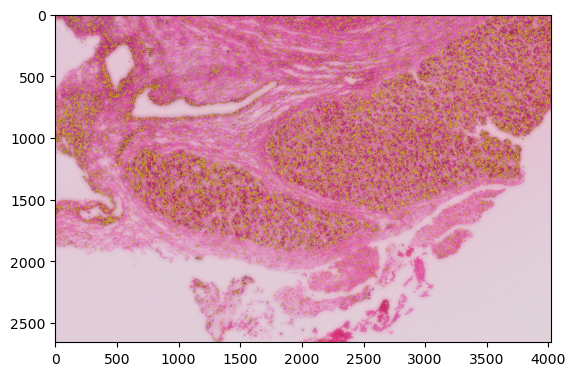

In [18]:
# ROI1
crop = b2c.get_crop(bdata, basis="spatial", spatial_key="spatial_cropped_150_buffer", mpp=mpp)

rendered = b2c.view_labels(image_path="stardist/he.tiff", 
                           labels_npz_path="stardist/he.npz", 
                           crop=crop)
plt.imshow(rendered)

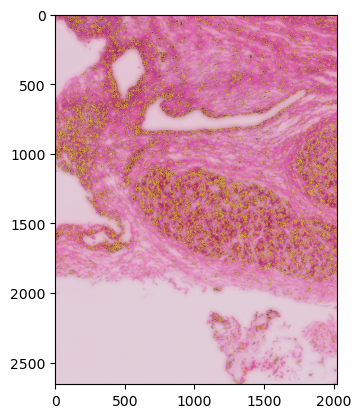

In [19]:
# ROI2
crop_2 = b2c.get_crop(bdata_2, basis="spatial", spatial_key="spatial_cropped_150_buffer", mpp=mpp)

rendered_2 = b2c.view_labels(image_path="stardist/he.tiff", 
                           labels_npz_path="stardist/he.npz", 
                           crop=crop_2)
plt.imshow(rendered_2)

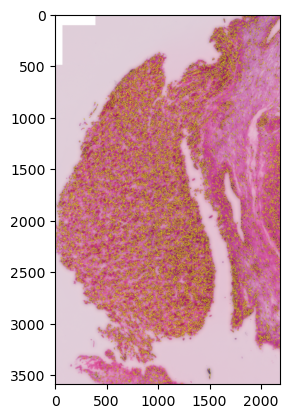

In [20]:
# ROI3
crop_3 = b2c.get_crop(bdata_3, basis="spatial", spatial_key="spatial_cropped_150_buffer", mpp=mpp)

rendered_3 = b2c.view_labels(image_path="stardist/he.tiff", 
                           labels_npz_path="stardist/he.npz", 
                           crop=crop_3)
plt.imshow(rendered_3)

I think it's quite good

### **Expansion of nuclei segmentation to cells**

**While StarDist just identifies nuclei, here Bin2cell aims at identifying cells from the nuclei labels**

It can use two algo:

- for each segmented nucleus, it associates a cell by considering the nuclei + 2 bins away (2 is default value but can be customed in max_bin_distance)
- or each label can get a custom expansion distance derived from its bin count if we use algorithm="volume_ratio". It's based on the linear relationship between cell and nuclear volume.  It's controlled by volume_ratio with a default of 4

**First algo based on 2 bins distance**

In [21]:
# Expand nuclei labels to bins around to segment cells based on a fixed number of surrounding bins
b2c.expand_labels(adata, 
                  labels_key='labels_he', 
                  expanded_labels_key="labels_he_expanded")

4211432600.py (6): Trying to modify attribute `.obs` of view, initializing view as actual.


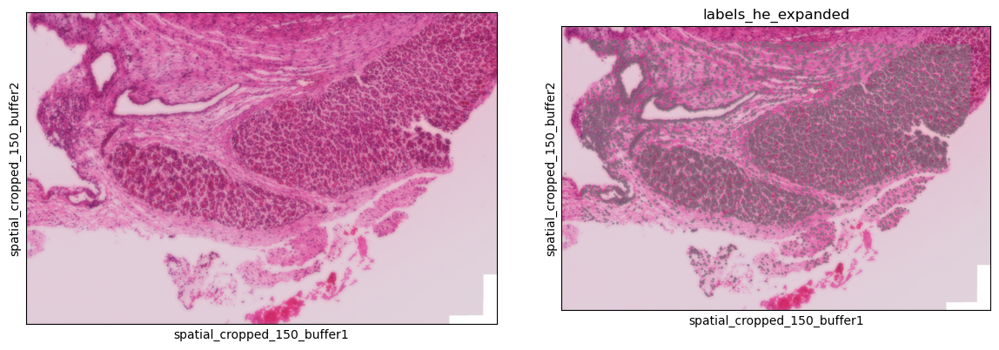

In [22]:
# Cell segmentation visualization for ROI1
bdata = adata[mask]

#the labels obs are integers, 0 means unassigned
bdata = bdata[bdata.obs['labels_he_expanded']>0]
bdata.obs['labels_he_expanded'] = bdata.obs['labels_he_expanded'].astype(str)

sc.pl.spatial(bdata, color=[None, "labels_he_expanded"], img_key="0.5_mpp_150_buffer", basis="spatial_cropped_150_buffer", legend_loc=None,
              save="segmentated_cells_ROI1.png")

3382414734.py (6): Trying to modify attribute `.obs` of view, initializing view as actual.


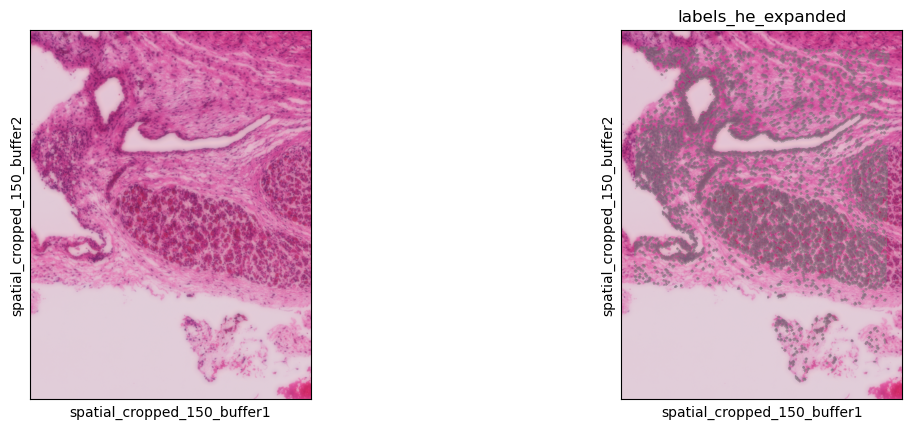

In [23]:
# Cell segmentation visualization for ROI2
bdata_2 = adata[mask_2]

#the labels obs are integers, 0 means unassigned
bdata_2 = bdata_2[bdata_2.obs['labels_he_expanded']>0]
bdata_2.obs['labels_he_expanded'] = bdata_2.obs['labels_he_expanded'].astype(str)

sc.pl.spatial(bdata_2, color=[None, "labels_he_expanded"], img_key="0.5_mpp_150_buffer", basis="spatial_cropped_150_buffer", legend_loc=None,
              save="segmentated_cells_ROI2.png")

869675211.py (6): Trying to modify attribute `.obs` of view, initializing view as actual.


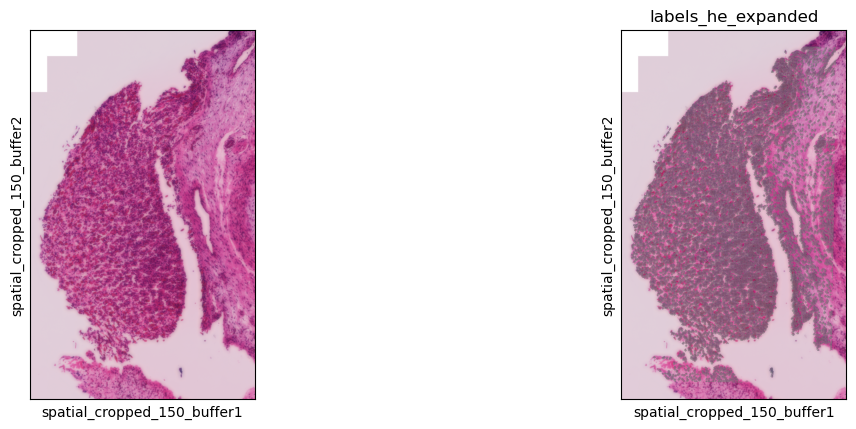

In [24]:
# Cell segmentation visualization for ROI3
bdata_3 = adata[mask_3]

#the labels obs are integers, 0 means unassigned
bdata_3 = bdata_3[bdata_3.obs['labels_he_expanded']>0]
bdata_3.obs['labels_he_expanded'] = bdata_3.obs['labels_he_expanded'].astype(str)

sc.pl.spatial(bdata_3, color=[None, "labels_he_expanded"], img_key="0.5_mpp_150_buffer", basis="spatial_cropped_150_buffer", legend_loc=None,
              save="segmentated_cells_ROI3.png")

**Second algo based on volume ratio**

In [25]:
# Expand nuclei labels to bins around to segment cells based on volume ratio
b2c.expand_labels(adata, 
                  labels_key='labels_he', 
                  expanded_labels_key="labels_he_expanded_vol",
                 algorithm="volume_ratio")

1456864326.py (6): Trying to modify attribute `.obs` of view, initializing view as actual.


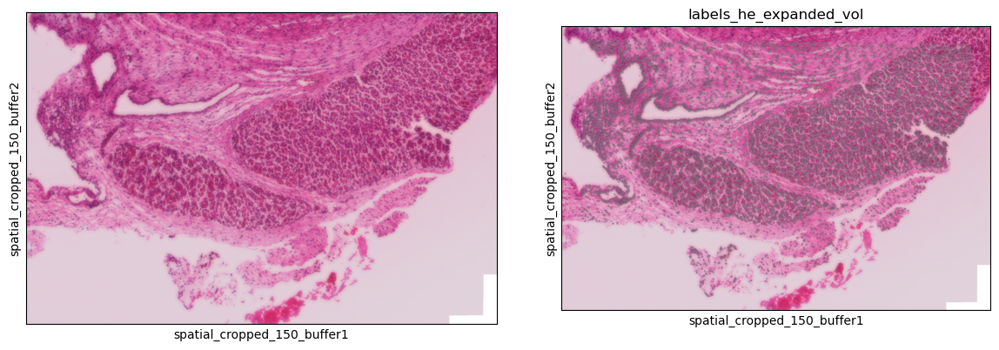

In [26]:
# Cell segmentation visualization for ROI1
bdata = adata[mask]

#the labels obs are integers, 0 means unassigned
bdata = bdata[bdata.obs['labels_he_expanded_vol']>0]
bdata.obs['labels_he_expanded_vol'] = bdata.obs['labels_he_expanded_vol'].astype(str)

sc.pl.spatial(bdata, color=[None, "labels_he_expanded_vol"], img_key="0.5_mpp_150_buffer", basis="spatial_cropped_150_buffer", legend_loc=None,
              save="segmentated_cells_vol_ROI1.png")

3675215106.py (6): Trying to modify attribute `.obs` of view, initializing view as actual.


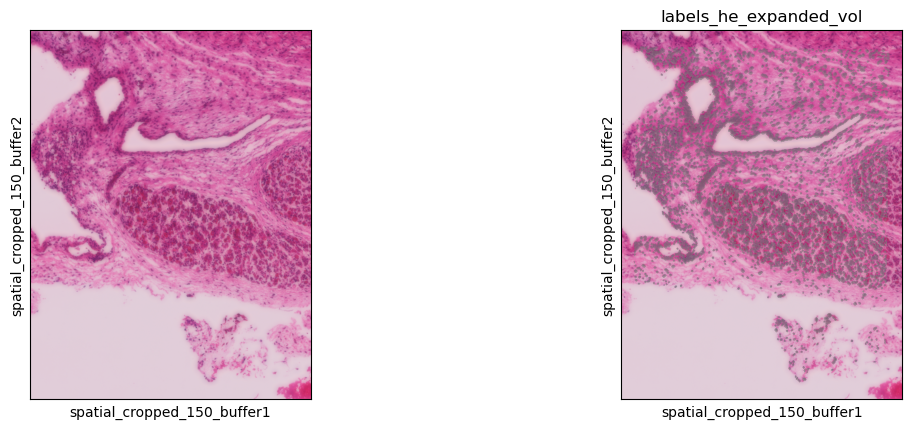

In [27]:
# Cell segmentation visualization for ROI2
bdata_2 = adata[mask_2]

#the labels obs are integers, 0 means unassigned
bdata_2 = bdata_2[bdata_2.obs['labels_he_expanded_vol']>0]
bdata_2.obs['labels_he_expanded_vol'] = bdata_2.obs['labels_he_expanded_vol'].astype(str)

sc.pl.spatial(bdata_2, color=[None, "labels_he_expanded_vol"], img_key="0.5_mpp_150_buffer", basis="spatial_cropped_150_buffer", legend_loc=None,
              save="segmentated_cells_vol_ROI2.png")

2094088710.py (6): Trying to modify attribute `.obs` of view, initializing view as actual.


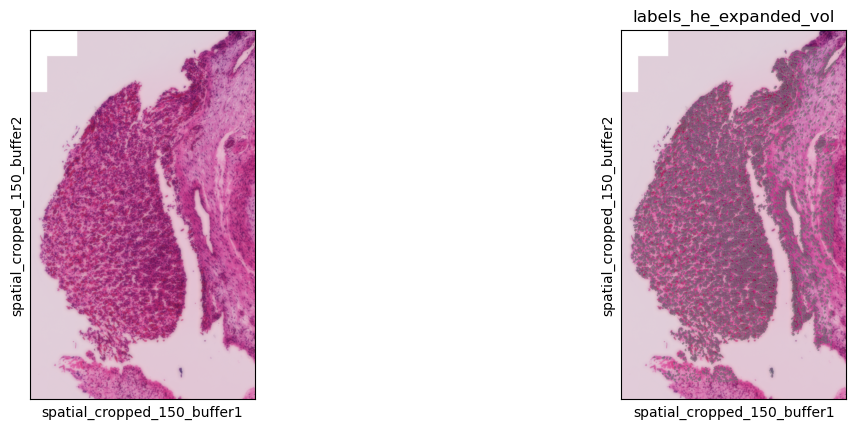

In [28]:
# Cell segmentation visualization for ROI3
bdata_3 = adata[mask_3]

#the labels obs are integers, 0 means unassigned
bdata_3 = bdata_3[bdata_3.obs['labels_he_expanded_vol']>0]
bdata_3.obs['labels_he_expanded_vol'] = bdata_3.obs['labels_he_expanded_vol'].astype(str)

sc.pl.spatial(bdata_3, color=[None, "labels_he_expanded_vol"], img_key="0.5_mpp_150_buffer", basis="spatial_cropped_150_buffer", legend_loc=None,
              save="segmentated_cells_vol_ROI3.png")

### **Secondary nuclei segmentation: on the gene expression data**

This aims at segmenting regions that were missed by the first nuclei segmentation which was done one the H&E (with a custom resolution). It uses the gene expression data, i.e. the counts per bin. It is optional. It performs well on sparse tissue, not on dense ones.

In [29]:
b2c.grid_image(adata, "n_counts_adjusted", mpp=mpp, sigma=5, save_path="stardist/gex.tiff")

In [30]:
# This part uses the fluorescence model of StarDist and performs cell expansion
b2c.stardist(image_path="stardist/gex.tiff", 
             labels_npz_path="stardist/gex.npz", 
             stardist_model="2D_versatile_fluo", 
             prob_thresh=0.05, #low prob_thresh: less stringent, i.e. will easily include a segmented object to cell label 
             nms_thresh=0.5) #high nms_thresh: requires more of the putative objects to be overlapping to be merged, helps in denser regions

Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.
effective: block_size=(4096, 4096), min_overlap=(128, 128), context=(128, 128)


functional.py (237): The structure of `inputs` doesn't match the expected structure.
Expected: ['input']
Received: inputs=Tensor(shape=(1, 256, 256, 1))
  0%|          | 0/16 [00:00<?, ?it/s]functional.py (237): The structure of `inputs` doesn't match the expected structure.
Expected: ['input']
Received: inputs=Tensor(shape=(1, None, None, 1))
100%|██████████| 16/16 [03:40<00:00, 13.76s/it]


Found 36495 objects


In [31]:
b2c.insert_labels(adata, 
                  labels_npz_path="stardist/gex.npz", 
                  basis="array", 
                  mpp=mpp, 
                  labels_key="labels_gex")

Visualization of the GEX space segmentation in our H&E of custom resolution in our regions of interest

684294947.py (7): Trying to modify attribute `.obs` of view, initializing view as actual.


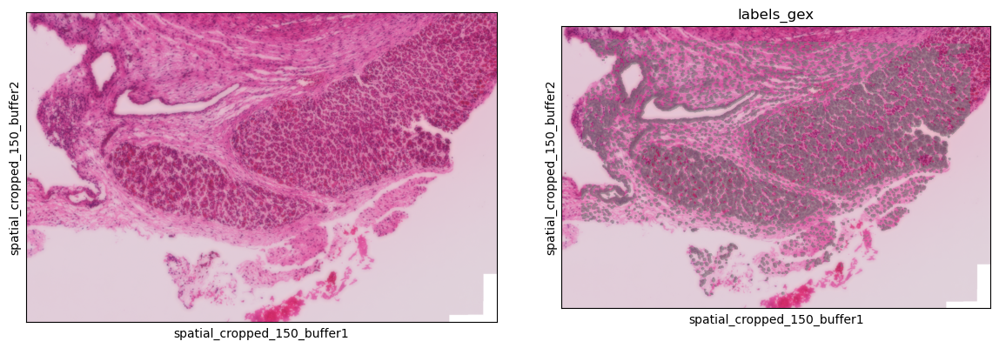

In [32]:
# ROI1

bdata = adata[mask]

#the labels obs are integers, 0 means unassigned
bdata = bdata[bdata.obs['labels_gex']>0]
bdata.obs['labels_gex'] = bdata.obs['labels_gex'].astype(str)

sc.pl.spatial(bdata, color=[None, "labels_gex"], img_key="0.5_mpp_150_buffer", basis="spatial_cropped_150_buffer", legend_loc=None)

976840979.py (7): Trying to modify attribute `.obs` of view, initializing view as actual.


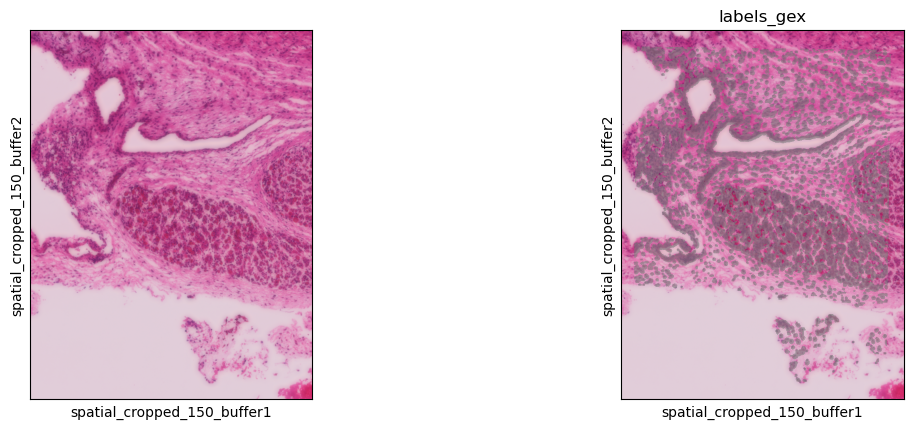

In [33]:
# ROI2

bdata_2 = adata[mask_2]

#the labels obs are integers, 0 means unassigned
bdata_2 = bdata_2[bdata_2.obs['labels_gex']>0]
bdata_2.obs['labels_gex'] = bdata_2.obs['labels_gex'].astype(str)

sc.pl.spatial(bdata_2, color=[None, "labels_gex"], img_key="0.5_mpp_150_buffer", basis="spatial_cropped_150_buffer", legend_loc=None)

2323691465.py (7): Trying to modify attribute `.obs` of view, initializing view as actual.


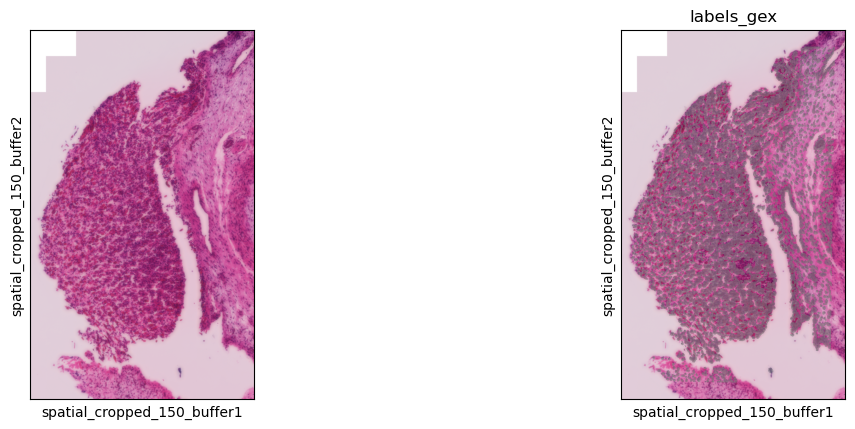

In [34]:
# ROI3

bdata_3 = adata[mask_3]

#the labels obs are integers, 0 means unassigned
bdata_3 = bdata_3[bdata_3.obs['labels_gex']>0]
bdata_3.obs['labels_gex'] = bdata_3.obs['labels_gex'].astype(str)

sc.pl.spatial(bdata_3, color=[None, "labels_gex"], img_key="0.5_mpp_150_buffer", basis="spatial_cropped_150_buffer", legend_loc=None)

Visualization on the initial image

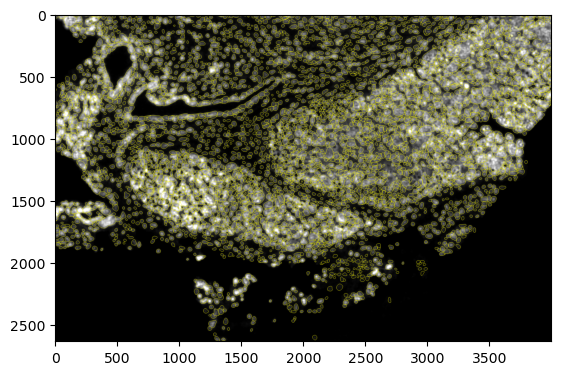

In [35]:
# ROI1

crop = b2c.get_crop(bdata, basis="array", mpp=mpp)

#GEX pops better with percentile normalisation performed
rendered = b2c.view_labels(image_path="stardist/gex.tiff", 
                           labels_npz_path="stardist/gex.npz", 
                           crop=crop,
                           stardist_normalize=True)
plt.imshow(rendered)

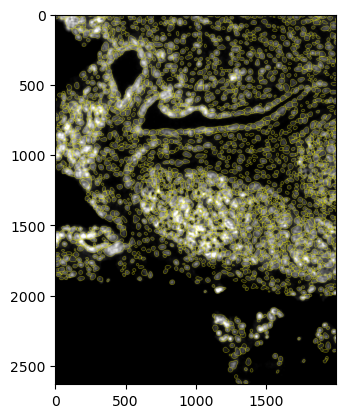

In [36]:
# ROI2

crop_2 = b2c.get_crop(bdata_2, basis="array", mpp=mpp)

#GEX pops better with percentile normalisation performed
rendered_2 = b2c.view_labels(image_path="stardist/gex.tiff", 
                           labels_npz_path="stardist/gex.npz", 
                           crop=crop_2,
                           stardist_normalize=True)
plt.imshow(rendered_2)

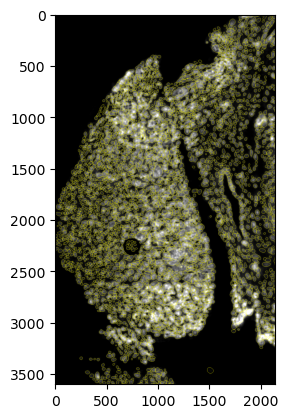

In [37]:
# ROI3

crop_3 = b2c.get_crop(bdata_3, basis="array", mpp=mpp)

#GEX pops better with percentile normalisation performed
rendered_3 = b2c.view_labels(image_path="stardist/gex.tiff", 
                           labels_npz_path="stardist/gex.npz", 
                           crop=crop_3,
                           stardist_normalize=True)
plt.imshow(rendered_3)

### **Use the GEX based segmentation as a tool to fill in the gaps in the H&E (custom resolution)-based segmentation**

In [38]:
# Keep only labels (=cells) that are found in H&E segmentation or the ones additionnally found in the GEX segmentation
b2c.salvage_secondary_labels(adata, 
                             primary_label="labels_he_expanded", 
                             secondary_label="labels_gex", 
                             labels_key="labels_joint")

Salvaged 3065 secondary labels


3993419985.py (7): Trying to modify attribute `.obs` of view, initializing view as actual.


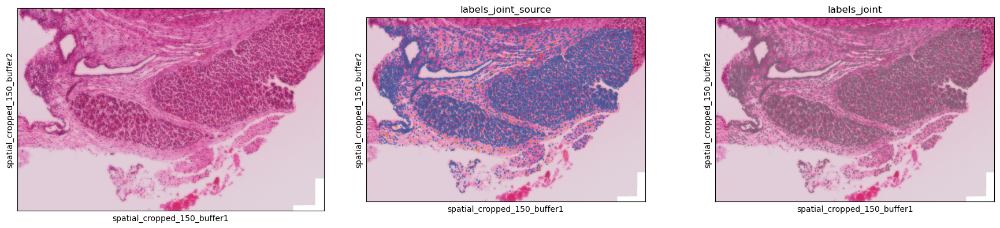

In [39]:
# Visualization of labels coming from the first or the second segmentation method

bdata = adata[mask]

#the labels obs are integers, 0 means unassigned
bdata = bdata[bdata.obs['labels_joint']>0]
bdata.obs['labels_joint'] = bdata.obs['labels_joint'].astype(str)

sc.pl.spatial(bdata, color=[None, "labels_joint_source", "labels_joint"], 
              img_key="0.5_mpp_150_buffer", basis="spatial_cropped_150_buffer", legend_loc=None)

**Now that bins have been assigned to cells, we groups bins into cells**

In [40]:
cdata = b2c.bin_to_cell(adata, labels_key="labels_joint", spatial_keys=["spatial", "spatial_cropped_150_buffer"])

anndata.py (1146): Trying to modify attribute `.obs` of view, initializing view as actual.


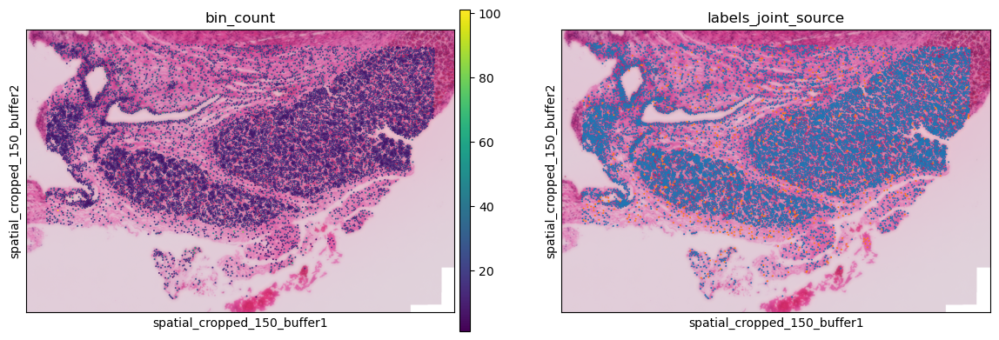

In [44]:
# ROI1

cell_mask = ((cdata.obs['array_row'] >= 2500) & 
             (cdata.obs['array_row'] <= 3300) & 
             (cdata.obs['array_col'] >= 1000) & 
             (cdata.obs['array_col'] <= 2000))


ddata = cdata[cell_mask]
sc.pl.spatial(ddata, color=["bin_count", "labels_joint_source"], 
              img_key="0.5_mpp_150_buffer", basis="spatial_cropped_150_buffer", legend_loc=None)

anndata.py (1146): Trying to modify attribute `.obs` of view, initializing view as actual.


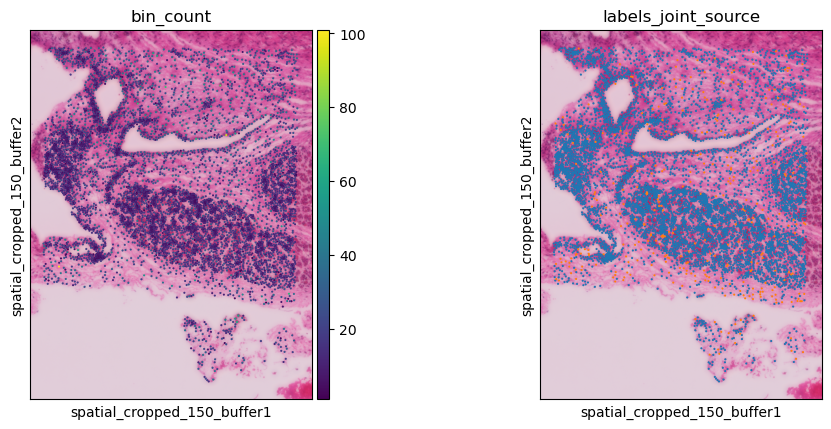

In [42]:
# ROI2

cell_mask_2 = ((cdata.obs['array_row'] >= 2500) & 
             (cdata.obs['array_row'] <= 3300) & 
             (cdata.obs['array_col'] >= 1500) & 
             (cdata.obs['array_col'] <= 2000))

ddata_2 = cdata[cell_mask_2]
sc.pl.spatial(ddata_2, color=["bin_count", "labels_joint_source"], 
              img_key="0.5_mpp_150_buffer", basis="spatial_cropped_150_buffer", legend_loc=None)

anndata.py (1146): Trying to modify attribute `.obs` of view, initializing view as actual.


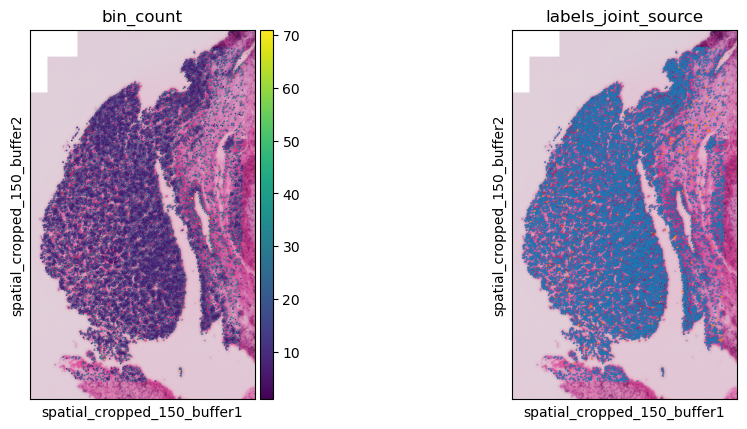

In [43]:
# ROI3

cell_mask_3 = ((cdata.obs['array_row'] >= 1700) & 
             (cdata.obs['array_row'] <= 2600) & 
             (cdata.obs['array_col'] >= 2000) & 
             (cdata.obs['array_col'] <= 3000))

ddata_3 = cdata[cell_mask_3]
sc.pl.spatial(ddata_3, color=["bin_count", "labels_joint_source"], 
              img_key="0.5_mpp_150_buffer", basis="spatial_cropped_150_buffer", legend_loc=None)

At this point the object is ready for further analysis. As destriping provides non-integer values, if integers are strictly necessary for a downstream application just round the count matrix.

In [48]:
# Save the final object
cdata.write_h5ad(filename='cdata_EOM.h5ad')